<a href="https://colab.research.google.com/github/vis-hal-k/Internship_Data_science/blob/main/Open_CV_Basic/Denosing_edgeDetection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [5]:
#  import 
import cv2 
from google.colab.patches import cv2_imshow

In [6]:
# Loading Image
i_cat = "/content/drive/MyDrive/Colab Notebooks/Open_cv_Course/Part_one/Cat.jpg"
i_rgby = "/content/drive/MyDrive/Colab Notebooks/Open_cv_Course/RGBY.jpg"
i_cat = cv2.imread(i_cat)
i_rgby = cv2.imread(i_rgby)

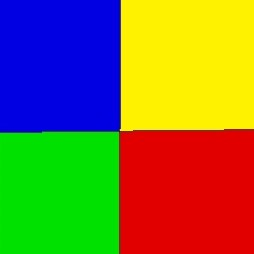

(254, 254, 3)

In [7]:
cv2_imshow(i_rgby)
i_rgby.shape
# cv2.waitkey(0) 
# cv2.destroyAllWindows()

In [8]:
print("Top Left" , i_rgby[0,0])
print("Top right" , i_rgby[0,253])
print("Bottom Left" , i_rgby[253,0])
print("Bottom right" , i_rgby[253,253])

Top Left [226   0   1]
Top right [  0 242 254]
Bottom Left [  0 226   1]
Bottom right [  0   0 225]


It seems open cv work as **BGR** format

blue pixel


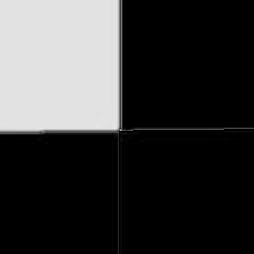

green pixel


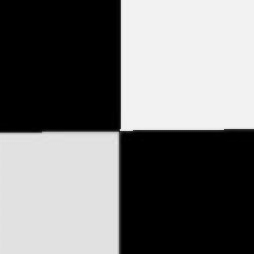

red pixel


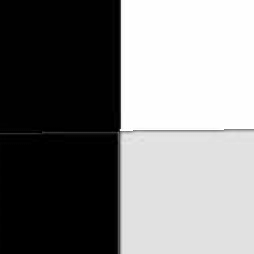

In [9]:
#  split b g r || 0 1 2 
blue = i_rgby[: , : ,0]
green = i_rgby[: ,: , 1]
red = i_rgby[: , : , 2]
#  we can write above same as ----
b,g,r = cv2.split(i_rgby)
# print
print("blue pixel")
cv2_imshow(blue)
print("green pixel")
cv2_imshow(green)
print("red pixel")
cv2_imshow(r)

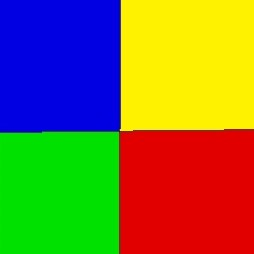

In [10]:
#  Merging above b  g r
ibgr_merge = cv2.merge((b,g,r))
cv2_imshow(ibgr_merge)

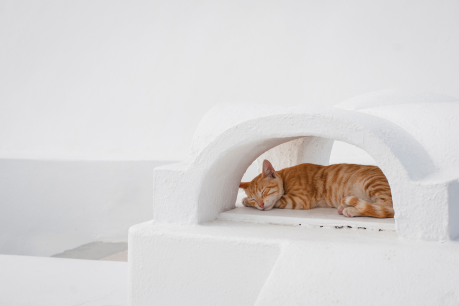

In [11]:
#  Resize the i_cat image 
ri_cat = cv2.resize(i_cat , None , fx = 0.125 , fy = 0.125, interpolation = cv2.INTER_AREA )
cv2_imshow(ri_cat)

In [12]:
display(ri_cat.shape , i_cat.shape) 
#  here we see image is double for INTER_AREA

(306, 459, 3)

(2450, 3675, 3)

In [13]:
ri_cat_cubic = cv2.resize(i_cat , None , fx = 0.5 , fy = 0.5, interpolation = cv2.INTER_CUBIC )
# cv2_imshow(ri_cat)
display(ri_cat_cubic.shape , i_cat.shape)

(1225, 1838, 3)

(2450, 3675, 3)

Scaling is just resizing of the image. OpenCV comes with a function cv.resize() for this purpose. The size of the image can be specified manually, or you can specify the scaling factor. Different interpolation methods are used. Preferable interpolation methods are cv.INTER_AREA for shrinking and cv.INTER_CUBIC (slow) & cv.INTER_LINEAR for zooming. By default, the interpolation method cv.INTER_LINEAR is used for all resizing purposes. You can resize an input image with either of following methods:

#  Denoising and edge detection using opencv in Python

In [25]:
import cv2
import numpy as np 
from matplotlib import pyplot as plt
img = "/content/drive/MyDrive/Colab Notebooks/Open_cv_Course/BSE_google_noisyJpg.jpg"
i_bse = cv2.imread(img)  
# cv2_imshow(i_bse)
# plt.imshow(i_bs)
print("dimension = " , i_bse.shape)

dimension =  (714, 901, 3)


kernel =  [[0.11111111 0.11111111 0.11111111]
 [0.11111111 0.11111111 0.11111111]
 [0.11111111 0.11111111 0.11111111]]


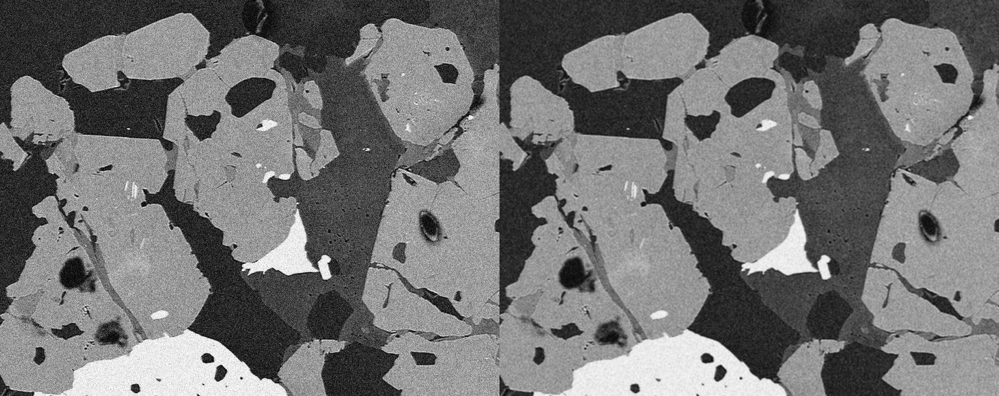

In [28]:
kernel = np.ones((3,3),np.float32)/9
print("kernel = ", kernel)
# cv.filter(arg1 , )
#  arg1 -> image , 
filt_2D = cv2.filter2D(i_bse , -1 , kernel)
# filt_2D
# cv2_imshow( filt_2D)
cv2_imshow(np.hstack((i_bse , filt_2D)))

## Filter Blur 

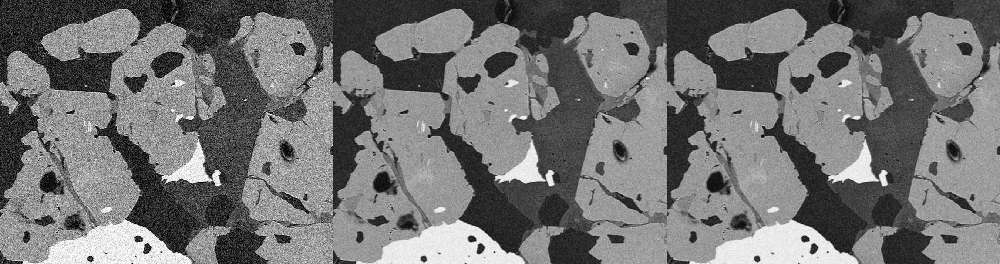

In [33]:
bluri=cv2.blur(i_bse, (3,3)) #this is built and funtion to blur the image
cv2_imshow(np.hstack(( i_bse ,filt_2D,bluri))) 

### Gaussian blur 

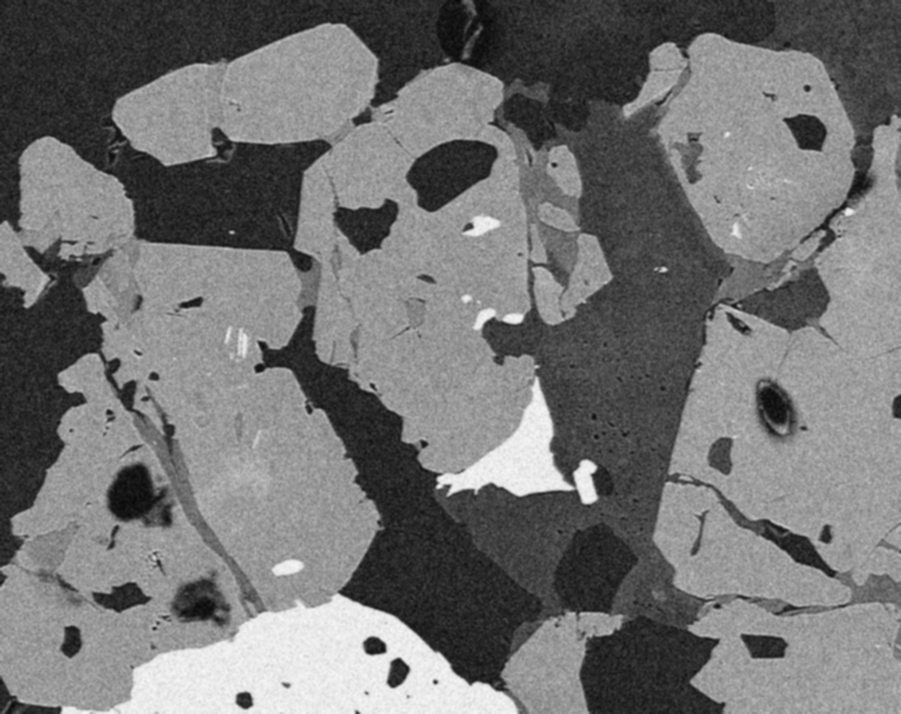

In [32]:
# gb - gaussian blur 
gb =  cv2.GaussianBlur(i_bse, (5,5) , 0 )
cv2_imshow(gb)

### Medain Blur 

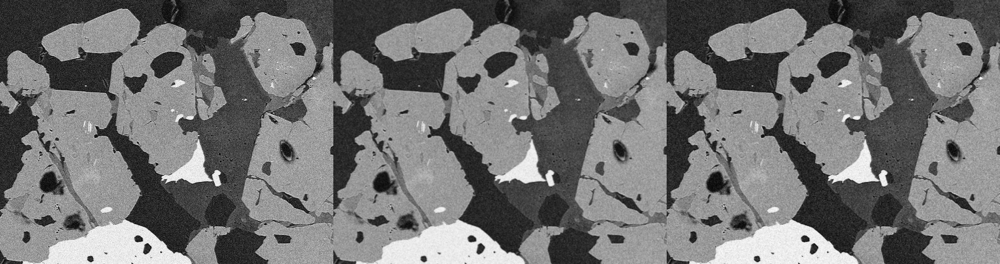

In [35]:
mb = cv2.medianBlur(i_bse , 3)
cv2_imshow(np.hstack(( i_bse,gb,mb))) 

### Bilateral Blur

<p>This filter is better for Bilateral Blur</p>


```
# dst = cv2.bilateralFilter(src, d, sigmaColor, sigmaSpace, borderType)
Here is an explanation of the arguments:

src: This is the source image, which should be a uint8 or float32 type.
d: The diameter of the pixel neighborhood used for filtering. It should be a positive integer.
sigmaColor: This parameter controls the color similarity weight. A larger value of sigmaColor means that the colors farther away from the central pixel will be less considered during filtering. It typically ranges from 10 to 150.
sigmaSpace: This parameter controls the spatial proximity weight. A larger value of sigmaSpace means that pixels farther away from the central pixel will have less influence during filtering. It typically ranges from 1 to 150.
borderType: This optional parameter specifies how to handle image borders. By default, it is set to cv2.BORDER_DEFAULT.
```



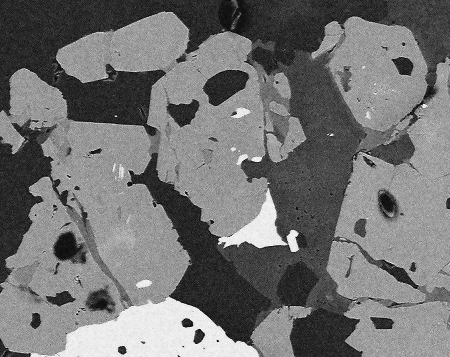

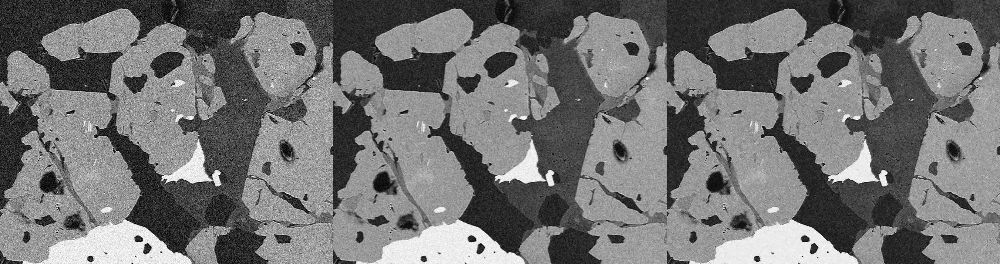

In [39]:
# bb - bilateral blur
bb = cv2.bilateralFilter(i_bse , 9, 75 , 75)
cv2_imshow(cv2.resize(bb, None , fx =0.5 , fy = 0.5 , interpolation = cv2.INTER_CUBIC))
cv2_imshow(np.hstack((i_bse,mb,bb))) 

## Canny Edge Detection

In [40]:
import cv2
from  matplotlib import pyplot as plt 

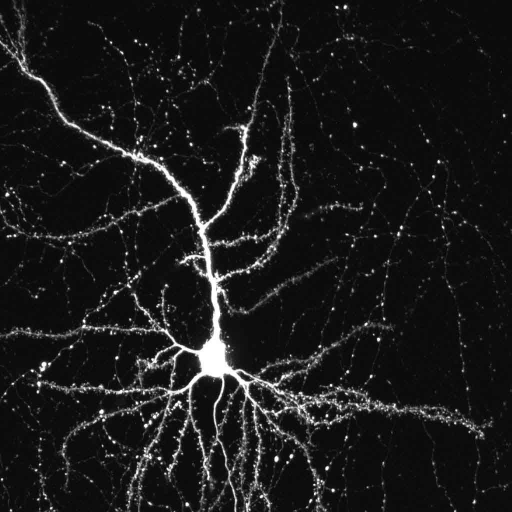

In [51]:
img2 = "/content/drive/MyDrive/Colab Notebooks/Open_cv_Course/neuron.jpg"
img2 = "/content/drive/MyDrive/Colab Notebooks/Open_cv_Course/.jpg"
i_neu = cv2.imread(img2 , 0 )
i_neu = cv2.resize(i_neu , None , fx = 0.5 , fy = 0.5 , interpolation = cv2.INTER_AREA)
cv2_imshow(i_neu)

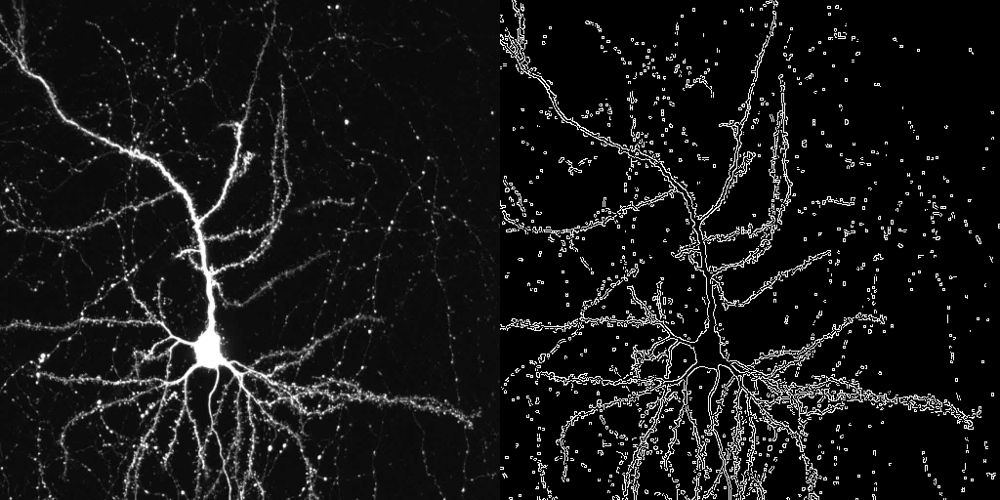

In [67]:
import cv2
from  matplotlib import pyplot as plt 
img2 = "/content/drive/MyDrive/Colab Notebooks/Open_cv_Course/neuron.jpg"
# img2 = "/content/drive/MyDrive/Colab Notebooks/Open_cv_Course/00001.jpg"
i_neu = cv2.imread(img2 , 0 )
i_neu = cv2.resize(i_neu , None , fx = 0.5 , fy = 0.5 , interpolation = cv2.INTER_AREA)
# cv2_imshow(i_neu)
# Canny Edge Detection 
edges = cv2.Canny(i_neu, 100 , 200 )
#  100 -> minimum  value of canny
#  200 -> maximum value of canny 
cv2_imshow(np.hstack((i_neu , edges)))

#  Merging two images using Open CV

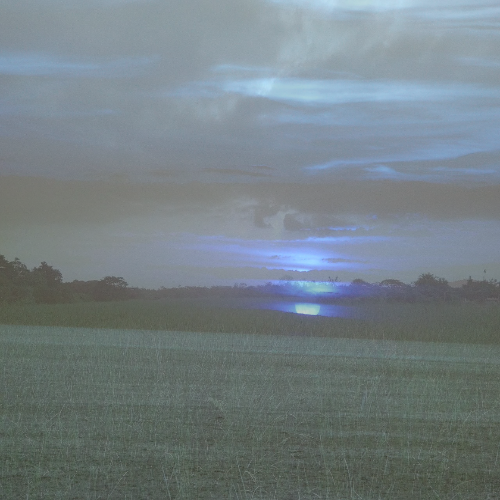

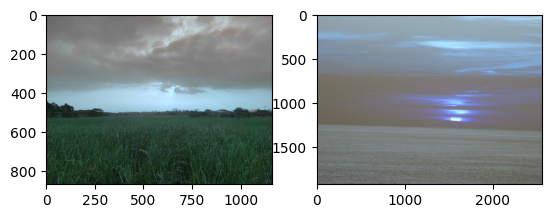

In [18]:
import cv2
import numpy as np 
image1= "/content/drive/My Drive/Colab Notebooks/Open_cv_Course/imgt2.jpg"
image2= "/content/drive/My Drive/Colab Notebooks/Open_cv_Course/imgt3.jpg"
image1 = cv2.imread(image1)  # shape -> (868, 1160, 3)
image2= cv2.imread(image2)    # shape -> (868, 1160, 3)
#  subplot the image 
plt.subplot(121), plt.imshow(image1)
plt.subplot(122), plt.imshow(image2)
image2 = cv2.resize(image2,(image1.shape[1], image1.shape[0]))
image2 = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB) # CONVERT TO RGB
image1 = cv2.cvtColor(image1,cv2.COLOR_BGR2RGB)  
#  PERFROMING MERGING AN IMAGE 
#  ---IMP---
# cv2.addWeighted(). This function blends the two images based on the provided alpha value, producing the merged image.
alpha = 0.3
merged_image = cv2.addWeighted(image1 , alpha , image2 , 1-alpha , 0 )
merged_im = cv2.resize(merged_image ,(500,500)) 
cv2_imshow(merged_im)

In [19]:
canny detetion 
sobel detection

SyntaxError: ignored